## Master

In [1]:
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import numpy as np

def RMSD(y, y_ref):
    N_var   = y_ref.shape[0] * y_ref.shape[1]
    RMSE    = np.sqrt(np.sum((y-y_ref)**2) / N_var)
    return np.array(RMSE)

## Error

<>:34: SyntaxWarning: invalid escape sequence '\A'
<>:73: SyntaxWarning: invalid escape sequence '\A'
<>:75: SyntaxWarning: invalid escape sequence '\m'
<>:109: SyntaxWarning: invalid escape sequence '\A'
<>:149: SyntaxWarning: invalid escape sequence '\A'
<>:157: SyntaxWarning: invalid escape sequence '\m'
<>:34: SyntaxWarning: invalid escape sequence '\A'
<>:73: SyntaxWarning: invalid escape sequence '\A'
<>:75: SyntaxWarning: invalid escape sequence '\m'
<>:109: SyntaxWarning: invalid escape sequence '\A'
<>:149: SyntaxWarning: invalid escape sequence '\A'
<>:157: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_4081469/4244666412.py:34: SyntaxWarning: invalid escape sequence '\A'
  ax.set_xlabel('Distance ($\AA$)')
/tmp/ipykernel_4081469/4244666412.py:73: SyntaxWarning: invalid escape sequence '\A'
  ax.set_xlabel('Distance ($\AA$)')
/tmp/ipykernel_4081469/4244666412.py:75: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('$|\mu_Z|$ Error\n(Debye)')
/tmp/ipyker

LiH E
qEOM 0.00048448585296244
AqEOM 4.429698498672907e-08
LiH D
qEOM 0.35032870643500286
AqEOM 0.008828553561752576
H2O E
qEOM 0.0004846573943935444
AqEOM 0.0004695885778358037
H2O D
qEOM 0.01959138170479711
AqEOM 0.023600484558001435


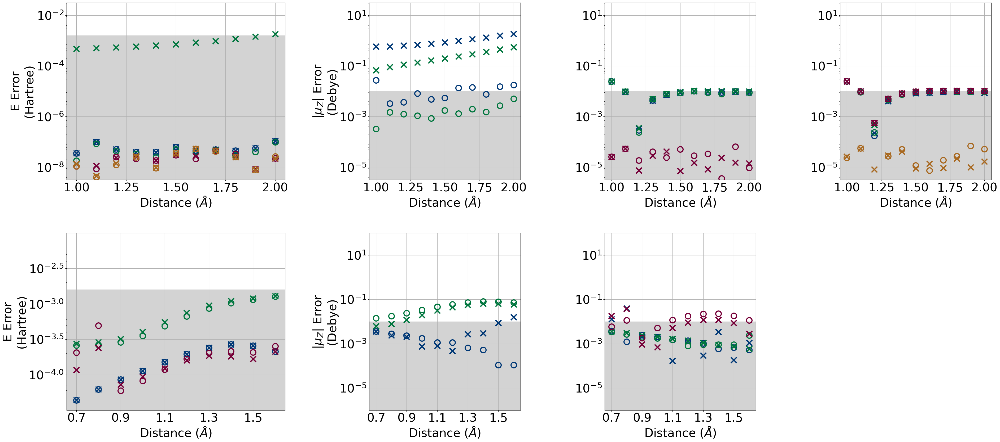

In [ ]:
fig, axs    = plt.subplots(2, 4, figsize=(45, 20), width_ratios=[13, 9, 9, 9])
plt.subplots_adjust(hspace=0.3, wspace=0.5)
plt.rc('font', size=32)

# LiH E
master_dir  = "***/Data"
colors      = ['#003876', '#00763e', '#760038', "#a8681f"]
dist_lst    = np.around(np.arange(1.0, 2.01, 0.1), 3)

# Data Load
energy_cas          = np.zeros((len(dist_lst), 4))
energy_qEOM         = np.zeros((len(dist_lst), 4))
energy_fqEOM        = np.zeros((len(dist_lst), 4))
energy_qEOM_diag    = np.zeros((len(dist_lst), 4))
for inddist, dist in enumerate(dist_lst):
    energy_cas[inddist]         = np.load(f"{master_dir}/LiH/Energy/{dist}_CAS.npy")[:4]
    energy_qEOM[inddist]        = np.load(f"{master_dir}/LiH/Energy/{dist}_CASCI_MATCH_qEOM.npy")
    energy_fqEOM[inddist]       = np.load(f"{master_dir}/LiH/Energy/{dist}_CASCI_MATCH_fqEOM.npy")
    energy_qEOM_diag[inddist]   = np.load(f"{master_dir}/LiH/Energy/{dist}_CASCI_MATCH_qEOM_Diag.npy")

print('LiH E')
print('qEOM', RMSD(energy_qEOM, energy_cas))
print('AqEOM', RMSD(energy_fqEOM, energy_cas))

ax = axs[0,0]
for ex in range(4):
    E_ref   = energy_cas[:, ex]
    ax.plot(dist_lst, abs(energy_fqEOM[:, ex]-E_ref), marker='o', markersize=15, linewidth=0, markeredgecolor=colors[ex], markerfacecolor='none', markeredgewidth=3)
    ax.plot(dist_lst, abs(energy_qEOM[:, ex]-E_ref) , color=colors[ex], marker='x', markersize=16, linewidth=0, markeredgecolor=colors[ex], mew=3.5)
ax.axhspan(0, 1/627.509, color='lightgray')

ax.grid()
ax.set_xticks([1.0, 1.25, 1.5, 1.75, 2.0])
ax.set_xlabel('Distance ($\AA$)')
ax.set_ylabel('$E_n^{O/U}$ Error\n(Hartree)')
ax.set_yscale('log')
ax.set_ylim(10**(-8.5), 10**(-1.5))
ax.set_yticks([1e-8, 1e-6, 1e-4, 1e-2])

# LiH D
# Data Load
dipole_cas          = np.zeros((len(dist_lst), 4, 4, 3))
dipole_qEOM         = np.zeros((len(dist_lst), 4, 4, 3))
dipole_fqEOM        = np.zeros((len(dist_lst), 4, 4, 3))
for inddist, dist in enumerate(dist_lst):
    dipole_cas[inddist]     = abs(np.load(f"{master_dir}/LiH/Dipole/{dist}_CAS.npy")[:4, :4]) / 0.393430
    dipole_qEOM[inddist]    = abs(np.load(f"{master_dir}/LiH/Dipole/{dist}_CASCI_MATCH_qEOM.npy")) / 0.393430
    dipole_fqEOM[inddist]   = abs(np.load(f"{master_dir}/LiH/Dipole/{dist}_CASCI_MATCH_fqEOM.npy")) / 0.393430

dip_cas             = np.zeros((len(dist_lst), sum(range(5))))
dip_qEOM            = np.zeros((len(dist_lst), sum(range(5))))
dip_fqEOM           = np.zeros((len(dist_lst), sum(range(5))))
master_count        = 0
for Rind in range(4):
    for Lind in range(Rind + 1):
        dip_cas[:, master_count]    = dipole_cas[:, Lind, Rind, 2]  
        dip_qEOM[:, master_count]   = dipole_qEOM[:, Lind, Rind, 2]
        dip_fqEOM[:, master_count]  = dipole_fqEOM[:, Lind, Rind, 2] 
        master_count               += 1

print('LiH D')
print('qEOM', RMSD(dip_qEOM, dip_cas))
print('AqEOM', RMSD(dip_fqEOM, dip_cas))

# Plot
for i in range(1, 4):
    ax = axs[0, i]
    for ex in range(i + 1):
        ax.plot(dist_lst, abs(dipole_fqEOM[:, ex, i, 2]-dipole_cas[:, ex, i, 2]), marker='o', markersize=15, linewidth=0, markeredgecolor=colors[ex], markerfacecolor='none', markeredgewidth=3)
        ax.plot(dist_lst, abs(dipole_qEOM[:, ex, i, 2]-dipole_cas[:, ex, i, 2]) , color=colors[ex], marker='x', markersize=16, linewidth=0, markeredgecolor=colors[ex], mew=3.5)
    
    ax.set_ylim(10**(-5.5), 10**(1.5))
    ax.set_xlabel('Distance ($\AA$)')
    if i == 1:
        ax.set_ylabel('$|\mu_Z|$ Error\n(Debye)')
    ax.grid()
    ax.set_yscale('log')
    ax.set_xticks([1.0, 1.25, 1.5, 1.75, 2.0]) 
    ax.set_yticks([1e-5, 1e-3, 1e-1, 1e+1])
    ax.axhspan(0, 0.01, color='lightgray')

# H2O E
master_dir  = "***/Data"
colors      = ['#003876', '#00763e', '#760038', "#a8681f"]
dist_lst    = np.around(np.arange(0.7, 1.61, 0.1), 3)

# Data Load
energy_cas          = np.zeros((len(dist_lst), 3))
energy_qEOM         = np.zeros((len(dist_lst), 3))
energy_fqEOM        = np.zeros((len(dist_lst), 3))
energy_qEOM_diag    = np.zeros((len(dist_lst), 3))
for inddist, dist in enumerate(dist_lst):
    energy_cas[inddist]         = np.load(f"{master_dir}/H2O/Energy/{dist}_CAS.npy")[:3]
    energy_qEOM[inddist]        = np.load(f"{master_dir}/H2O/Energy/{dist}_CASCI_MATCH_qEOM.npy")
    energy_fqEOM[inddist]       = np.load(f"{master_dir}/H2O/Energy/{dist}_CASCI_MATCH_fqEOM.npy")
    energy_qEOM_diag[inddist]   = np.load(f"{master_dir}/H2O/Energy/{dist}_CASCI_MATCH_qEOM_Diag.npy")

print('H2O E')
print('qEOM', RMSD(energy_qEOM, energy_cas))
print('AqEOM', RMSD(energy_fqEOM, energy_cas))

ax = axs[1, 0]
for ex in range(3):
    E_ref   = energy_cas[:, ex]
    ax.plot(dist_lst, abs(energy_fqEOM[:, ex]-E_ref), marker='o', markersize=15, linewidth=0, markeredgecolor=colors[ex], markerfacecolor='none', markeredgewidth=3)
    ax.plot(dist_lst, abs(energy_qEOM[:, ex]-E_ref) , color=colors[ex], marker='x', markersize=16, linewidth=0, markeredgecolor=colors[ex], mew=3.5)

ax.grid()   
ax.set_xlabel('Distance ($\AA$)')
ax.set_ylabel('$E_n^{O/U}$ Error\n(Hartree)')
ax.set_yscale('log')
ax.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5])
ax.set_yticks([1e-4, 10**(-3.5), 1e-3, 10**(-2.5)], ['$10^{-4.0}$', '$10^{-3.5}$', '$10^{-3.0}$', '$10^{-2.5}$'])
ax.set_ylim(10**(-4.5), 10**(-2))
ax.axhspan(0, 1/627.509, color='lightgray')

# H2O D
# Data Load
dipole_cas          = np.zeros((len(dist_lst), 3, 3, 3))
dipole_qEOM         = np.zeros((len(dist_lst), 3, 3, 3))
dipole_fqEOM        = np.zeros((len(dist_lst), 3, 3, 3))
for inddist, dist in enumerate(dist_lst):
    dipole_cas[inddist]     = abs(np.load(f"{master_dir}/H2O/Dipole/{dist}_CAS.npy")[:3, :3]) / 0.393430
    dipole_qEOM[inddist]    = abs(np.load(f"{master_dir}/H2O/Dipole/{dist}_CASCI_MATCH_qEOM.npy")) / 0.393430
    dipole_fqEOM[inddist]   = abs(np.load(f"{master_dir}/H2O/Dipole/{dist}_CASCI_MATCH_fqEOM.npy")) / 0.393430

dip_cas             = np.zeros((len(dist_lst), sum(range(4))))
dip_qEOM            = np.zeros((len(dist_lst), sum(range(4))))
dip_fqEOM           = np.zeros((len(dist_lst), sum(range(4))))
master_count        = 0
for Rind in range(3):
    for Lind in range(Rind + 1):
        dip_cas[:, master_count]    = dipole_cas[:, Lind, Rind, 2]  
        dip_qEOM[:, master_count]   = dipole_qEOM[:, Lind, Rind, 2]
        dip_fqEOM[:, master_count]  = dipole_fqEOM[:, Lind, Rind, 2] 
        master_count               += 1

print('H2O D')
print('qEOM', RMSD(dip_qEOM, dip_cas))
print('AqEOM', RMSD(dip_fqEOM, dip_cas))

# Plot
for i in range(1, 3):
    err_sub = axs[1, i]
    for ex in range(i + 1):
        err_sub.plot(dist_lst, abs(dipole_fqEOM[:, ex, i, 2]-dipole_cas[:, ex, i, 2]), marker='o', markersize=15, linewidth=0, markeredgecolor=colors[ex], markerfacecolor='none', markeredgewidth=3)
        err_sub.plot(dist_lst, abs(dipole_qEOM[:, ex, i, 2]-dipole_cas[:, ex, i, 2]) , color=colors[ex], marker='x', markersize=16, linewidth=0, markeredgecolor=colors[ex], mew=3.5)
    
    err_sub.set_xlabel('Distance ($\AA$)')
    err_sub.grid()
    err_sub.set_yscale('log')
    err_sub.set_xticks([0.7, 0.9, 1.1, 1.3, 1.5]) 
    err_sub.set_yticks([1e-5, 1e-3, 1e-1, 1e+1])
    err_sub.axhspan(0, 0.01, color='lightgray')
    err_sub.set_ylim(1e-6, 100)
    if i == 1:
        err_sub.set_ylabel('$|\mu_Z|$ Error\n(Debye)')

fig.delaxes(axs[1, 3])
plt.savefig('***/Data/Figs/Fig3_Err.png', bbox_inches='tight', dpi=1000)

In [6]:
###==================<<< Settings

master_dir  = "***/Data"
colors      = ['#003876', '#00763e', '#760038', "#a8681f"]
system_info = {
            'HeH'  : [3, np.around(np.arange(0.5, 2.01, 0.1), 3), [0.5, 1.0, 1.5, 2.0]       , [1e-9, 1e-5, 1e-1]],
            'LiH'  : [4, np.around(np.arange(1.0, 2.01, 0.1), 3), [1.0, 1.25, 1.5, 1.75, 2.0], [1e-8, 1e-6, 1e-4, 1e-2]],
            'BeH2' : [3, np.around(np.arange(0.7, 1.61, 0.1), 3), [0.7, 0.9, 1.1, 1.3, 1.5]  , [1e-7, 1e-4, 1e-1]],
            'NH3'  : [3, np.around(np.arange(0.5, 2.01, 0.1), 3), [0.5, 1.0, 1.5, 2.0]       , [1e-7, 1e-4, 1e-1]],
            'H2O'  : [3, np.around(np.arange(0.7, 1.61, 0.1), 3), [0.7, 0.9, 1.1, 1.3, 1.5]  , [1e-4, 10**(-3.5), 1e-3, 10**(-2.5)]],
            'HF'   : [3, np.around(np.arange(0.5, 2.01, 0.1), 3), [0.5, 1.0, 1.5, 2.0]       , [1e-6, 1e-3]]}

###==================<<< Plot

fig, axs    = plt.subplots(6, 4, figsize=(45, 60), width_ratios=[13, 9, 9, 9], dpi=600)
plt.subplots_adjust(hspace=0.3, wspace=0.5)
plt.rc('font', size=32)
systems     = list(system_info.keys())

for indsys, sys in enumerate(systems):
    # Load Energy
    dist_lst        = system_info[sys][1]
    N_state         = system_info[sys][0]
    energy_cas      = np.zeros((len(dist_lst), N_state))
    energy_qEOM     = np.zeros((len(dist_lst), N_state))
    energy_AqEOM    = np.zeros((len(dist_lst), N_state))
    for inddist, dist in enumerate(dist_lst):
        energy_cas[inddist]     = np.load(f"{master_dir}/{sys}/Energy/{dist}_CAS.npy")[:N_state]
        energy_qEOM[inddist]    = np.load(f"{master_dir}/{sys}/Energy/{dist}_CASCI_MATCH_qEOM.npy")
        energy_AqEOM[inddist]   = np.load(f"{master_dir}/{sys}/Energy/{dist}_CASCI_MATCH_fqEOM.npy")

    # Analytics
    print(sys, 'E')
    print('qEOM', RMSD(energy_qEOM, energy_cas))
    print('AqEOM', RMSD(energy_AqEOM, energy_cas))

    # Plot Energy Error
    ax = axs[indsys, 0]
    for ex in range(N_state):
        E_ref   = energy_cas[:, ex]
        ax.plot(dist_lst, abs(energy_AqEOM[:, ex]-E_ref), marker='o', markersize=15, linewidth=0, markeredgecolor=colors[ex], markerfacecolor='none', markeredgewidth=3)
        ax.plot(dist_lst, abs(energy_qEOM[:, ex]-E_ref) , color=colors[ex], marker='x', markersize=16, linewidth=0, markeredgecolor=colors[ex], mew=3.5)
    ax.axhspan(0, 1/627.509, color='lightgray')
    ax.grid()
    ax.set_xticks(system_info[sys][2])
    ax.set_xlabel('Distance ($\AA$)')
    ax.set_ylabel('$E_n^{O/U}$ Error\n(Hartree)')
    ax.set_yscale('log')
    #ax.set_ylim(10**(-8.5), 10**(-1.5))
    ax.set_yticks(system_info[sys][3])

    # Load Dipole
    dipole_cas          = np.zeros((len(dist_lst), N_state, N_state, 3))
    dipole_qEOM         = np.zeros((len(dist_lst), N_state, N_state, 3))
    dipole_AqEOM        = np.zeros((len(dist_lst), N_state, N_state, 3))
    for inddist, dist in enumerate(dist_lst):
        dipole_cas[inddist]     = abs(np.load(f"{master_dir}/{sys}/Dipole/{dist}_CAS.npy")[:N_state, :N_state]) / 0.393430
        dipole_qEOM[inddist]    = abs(np.load(f"{master_dir}/{sys}/Dipole/{dist}_CASCI_MATCH_qEOM.npy")) / 0.393430
        dipole_AqEOM[inddist]   = abs(np.load(f"{master_dir}/{sys}/Dipole/{dist}_CASCI_MATCH_fqEOM.npy")) / 0.393430

    # Plot Dipole
    for i in range(1, N_state):
        ax = axs[indsys, i]
        for ex in range(i + 1):
            ax.plot(dist_lst, abs(dipole_AqEOM[:, ex, i, 2]-dipole_cas[:, ex, i, 2]), marker='o', markersize=15, linewidth=0, markeredgecolor=colors[ex], markerfacecolor='none', markeredgewidth=3)
            ax.plot(dist_lst, abs(dipole_qEOM[:, ex, i, 2]-dipole_cas[:, ex, i, 2]) , color=colors[ex], marker='x', markersize=16, linewidth=0, markeredgecolor=colors[ex], mew=3.5)
        
        ax.set_ylim(10**(-5.5), 10**(1.5))
        ax.set_xlabel('Distance ($\AA$)')
        if i == 1:
            ax.set_ylabel('$|\mu_Z|$ Error\n(Debye)')
        ax.grid()
        ax.set_yscale('log')
        ax.set_xticks(system_info[sys][2]) 
        ax.set_yticks([1e-5, 1e-3, 1e-1, 1e+1])
        ax.axhspan(0, 0.01, color='lightgray')

    if indsys != 1:
        fig.delaxes(axs[indsys, 3])

plt.savefig('***/Data/Figs/Fig3_Err.png', bbox_inches='tight', dpi=600)

<>:46: SyntaxWarning: invalid escape sequence '\A'
<>:69: SyntaxWarning: invalid escape sequence '\A'
<>:71: SyntaxWarning: invalid escape sequence '\m'
<>:46: SyntaxWarning: invalid escape sequence '\A'
<>:69: SyntaxWarning: invalid escape sequence '\A'
<>:71: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_198013/1917728810.py:46: SyntaxWarning: invalid escape sequence '\A'
  ax.set_xlabel('Distance ($\AA$)')
/tmp/ipykernel_198013/1917728810.py:69: SyntaxWarning: invalid escape sequence '\A'
  ax.set_xlabel('Distance ($\AA$)')
/tmp/ipykernel_198013/1917728810.py:71: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('$|\mu_Z|$ Error\n(Debye)')


HeH E
qEOM 0.003075206480635955
AqEOM 8.729032693297589e-08
LiH E
qEOM 0.00048448585296244
AqEOM 4.429698498672907e-08
BeH2 E
qEOM 1.4904182756241815e-07
AqEOM 1.407701096171439e-07
NH3 E
qEOM 0.000415314305449798
AqEOM 3.799074551557407e-07
H2O E
qEOM 0.0004846573943935444
AqEOM 0.0004695885778358037
HF E
qEOM 2.197630603629311e-06
AqEOM 2.0131131295566865e-06
